# Mutli channels ICA applied to OBS data 

In [1]:
import os
import numpy as np
import pandas as pd
import scipy.signal as sp
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile

from utils import *
from skimage.metrics import structural_similarity as ssim

## Synthetic data

In [2]:
# FFT params
nperseg = 512
noverlap = 256
fs = 100

# Noise
np.random.seed(0)
snr = 5     # dB 

# Root to data TODO : change to your data path 
root = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\data\signaux_ica_jl"

### Load data
On charge trois signaux simulés : 
- Onde T 
- Navire 
- Zcall 

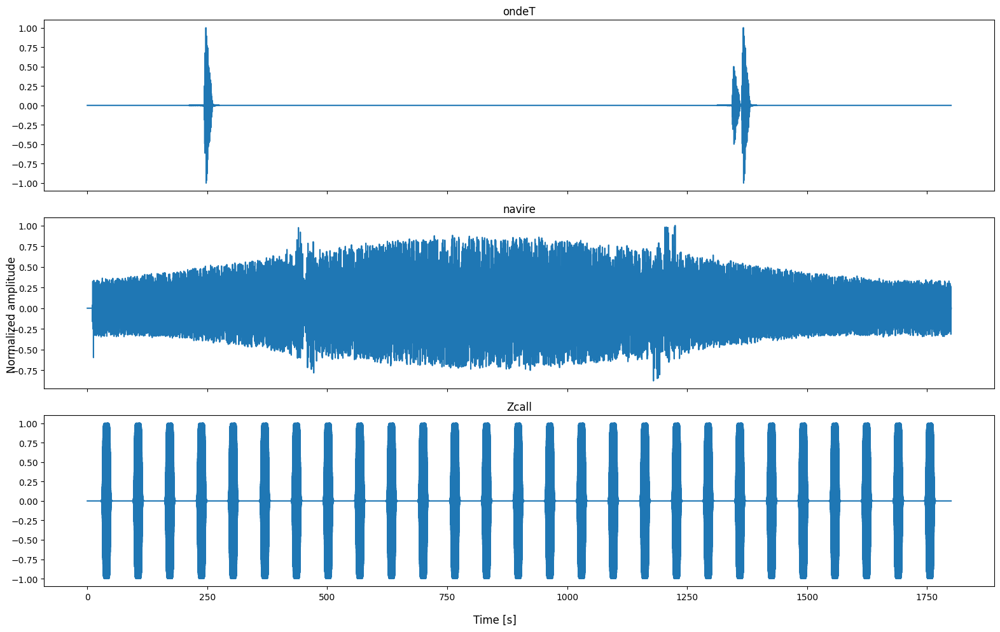

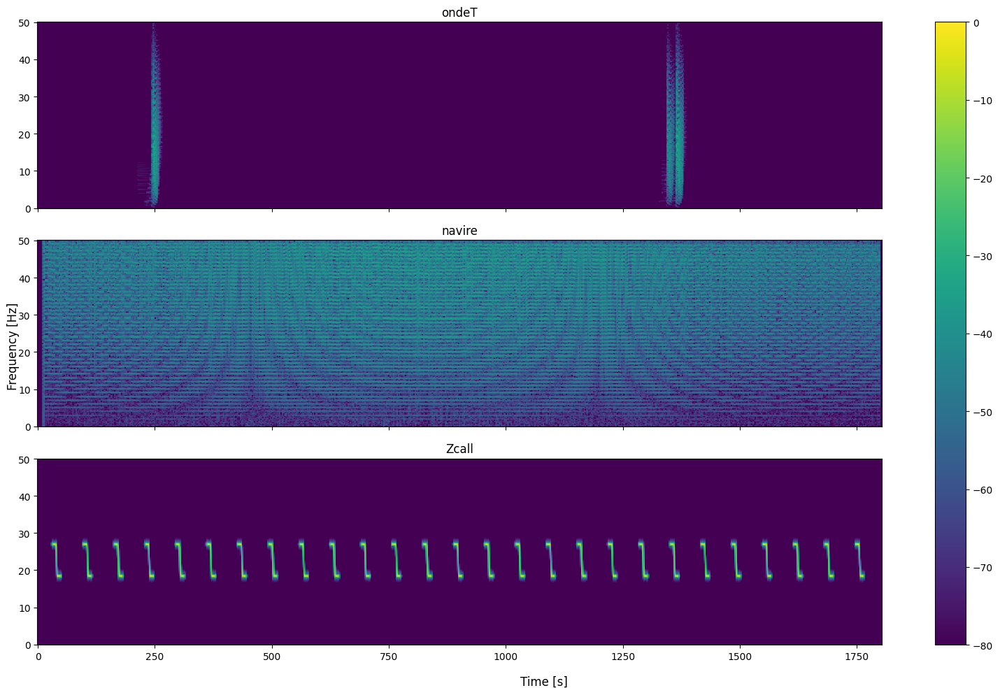

In [3]:
data = load_synthetic_data(fs, nperseg, noverlap, snr=None, root=root)  
plot_input_signals(data)

### Cas identique à J.L  
- Configuration type OBS : 3 récepteurs
- Mélange : uniforme (pas de bruit sur la matrice de mélange)  
- Bruit : bruit additif gaussien 
- SNR : 1dB (il me semble que J.L utilise un bruit avec un écart type de 0.1 ce qui correspond à $snr \approx 0.85$ dB)

In [4]:
snr = 1
n_rcv = 3
mixing_noise_level = 0

In [5]:
print(data["vars"])
# Mix data 
X, S, A = mix_synthetic_signals(data, mixing_noise_level=mixing_noise_level, verbose=True, a0=2, n_rcv=n_rcv, snr=snr)
# Apply ICA 
S_, A_ = apply_ica(X, n_components=3)

['ondeT', 'navire', 'Zcall']
Mixing matrix : [[2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]]
ICA model applies : True
Components : [[ 0.35608682 -2.43928933  2.07980253]
 [-0.8394533  -0.85022075 -0.85378699]
 [-2.60147777  0.98645864  1.59906534]]
Mixing : [[ 0.03403748 -0.39162131 -0.25336826]
 [-0.23445401 -0.3934467   0.09486691]
 [ 0.20000867 -0.39440242  0.15464397]]
Mean : [ 0.00040906 -0.00053261 -0.00059552]


## Plot mixed signal 

Text(0.5, 1.0, 'Spectrogramme de base')

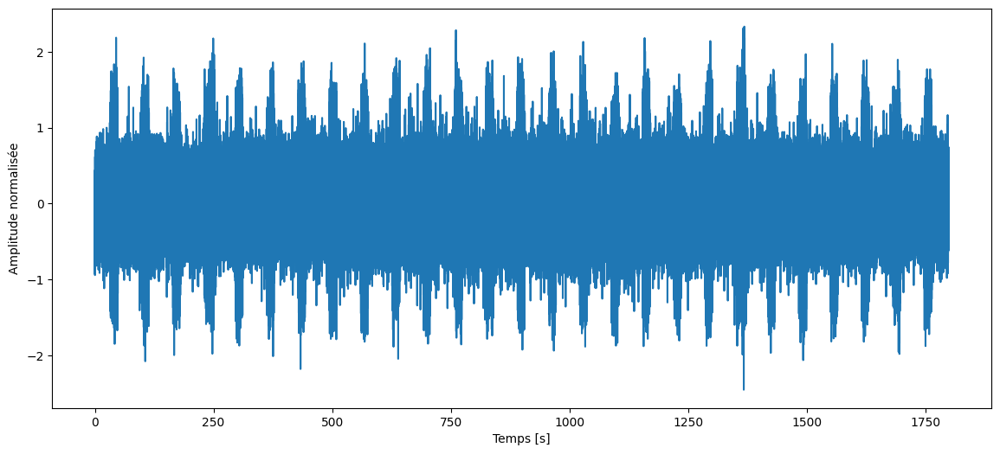

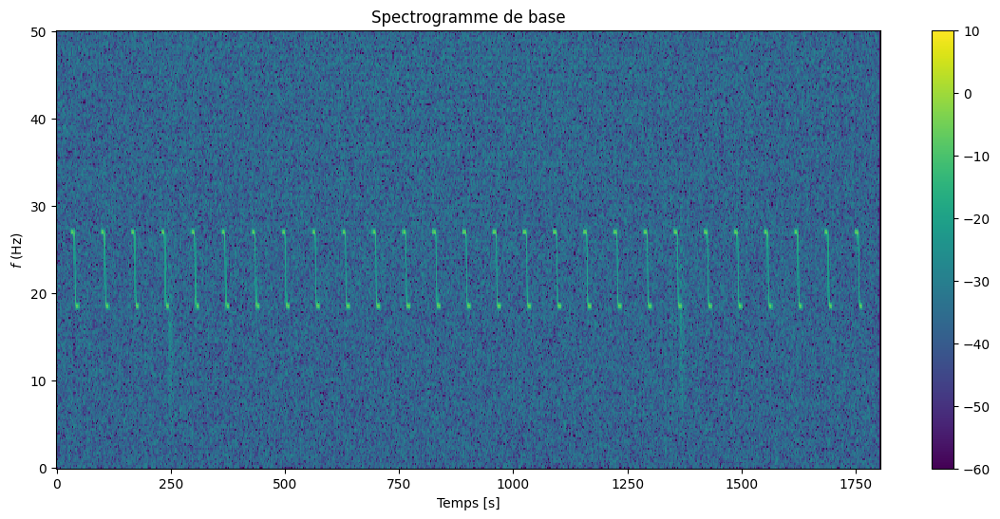

In [6]:
sig = X[:, 0]   # First component 

plt.figure(figsize=(14, 6))
plt.plot(data["time"], sig)
plt.xlabel("Temps [s]")
plt.ylabel("Amplitude normalisée")

f, t, st = sp.stft(
    sig, fs=100, window="hann", nperseg=nperseg, noverlap=noverlap
)
plt.figure(figsize=(14, 6))
plt.pcolormesh(t, f, 20 * np.log10(abs(st)))
plt.clim([-60, +10])
plt.colorbar()
plt.xlabel("Temps [s]")
plt.ylabel("$f$ (Hz)")
plt.title("Spectrogramme de base")

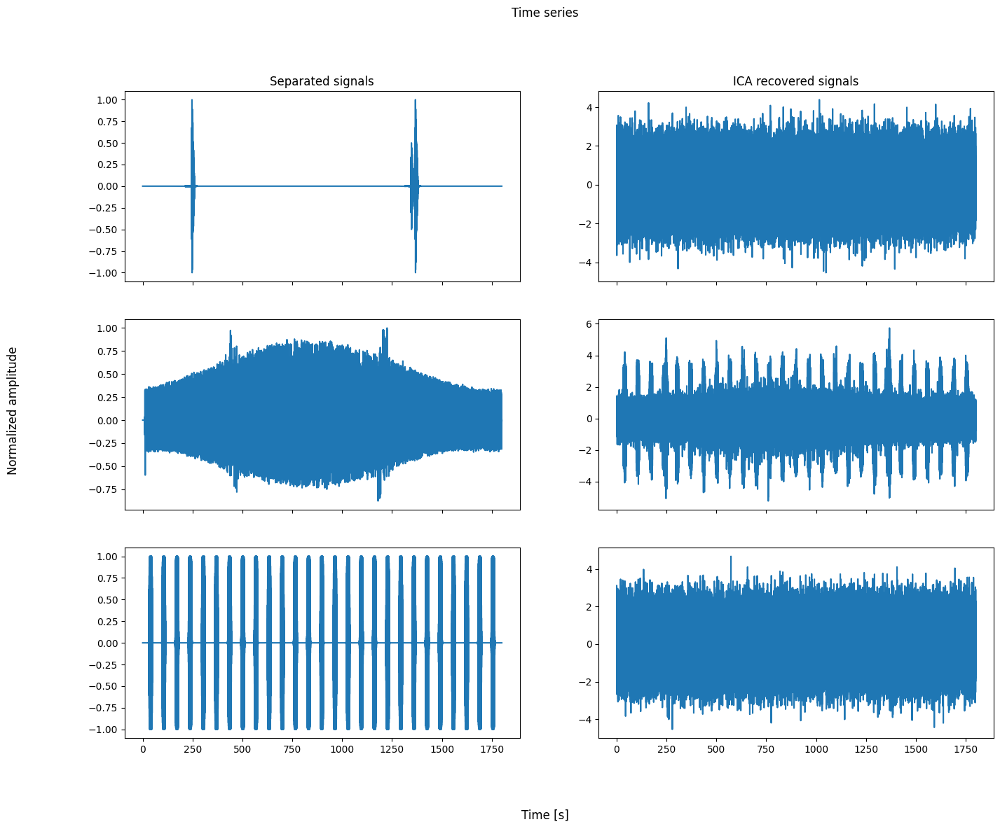

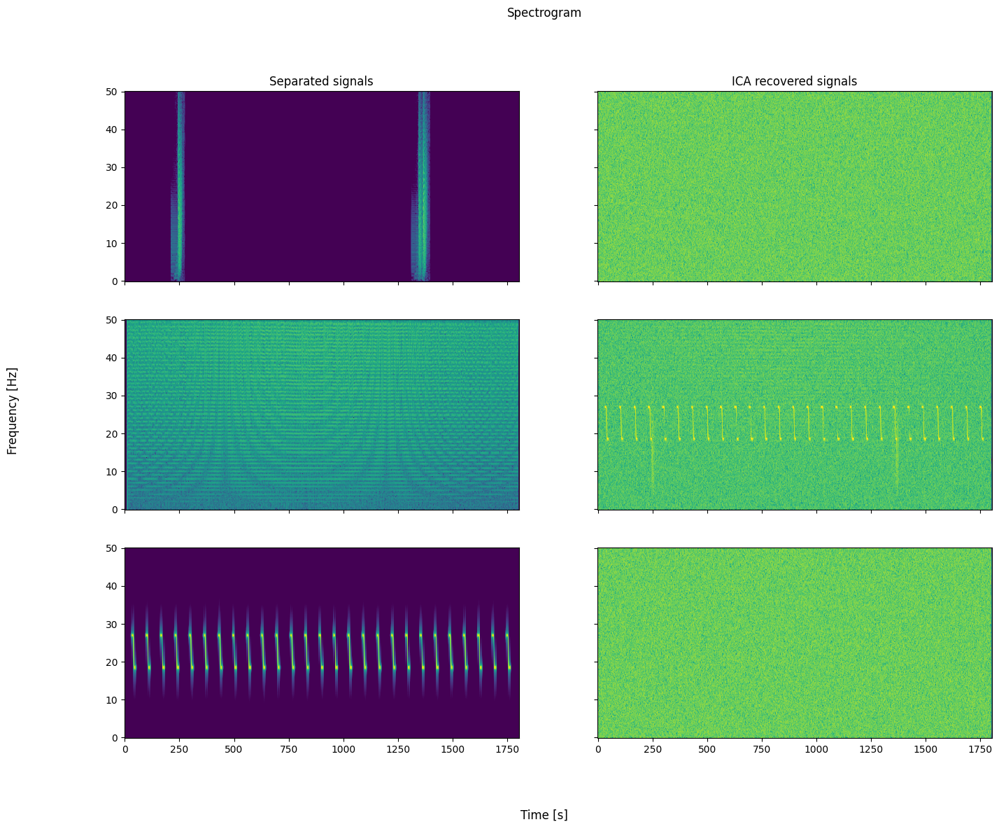

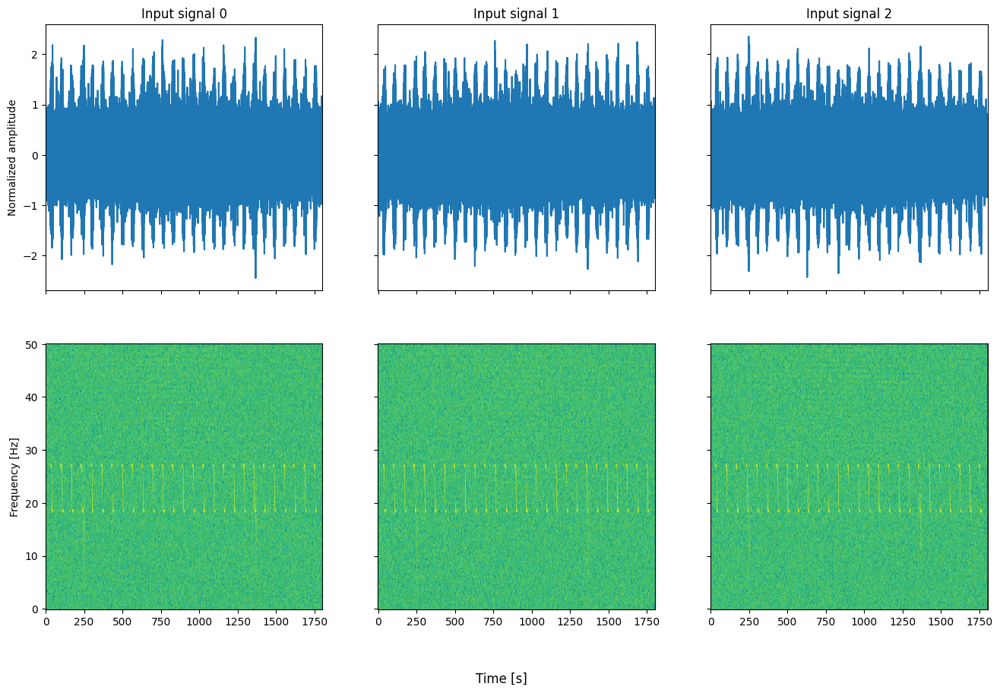

In [7]:
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120)

- La méthode est incapable de séparer les trois signaux. 
- L'utilisation de 3 récepteurs n'apporte probablement rien en raison de la matrice de mélange symétrique : les 3 signaux en entrée de l'ICA sont donc le résultat de la même combinaison linéaire (le système est sous-déterminé)
- La méthode semble néanmoins séparer la composante signal de la composante bruit blanc gaussien

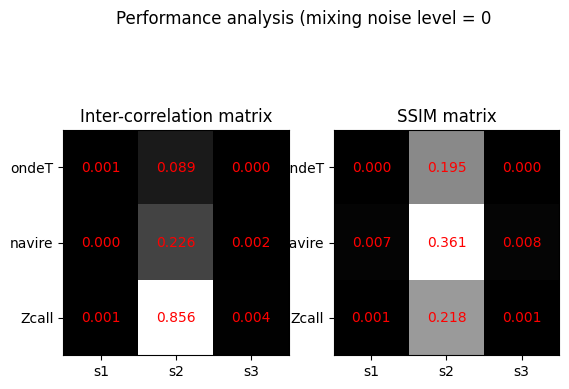

In [8]:
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])

#### Concernant le 2ème point
On peut vérifier le deuxième point en enlevant le bruit des signaux mélangés, dans ce cas la méthode est clairement inopérante

Mixing matrix : [[2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]]


c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\sklearn\decomposition\_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


ICA model applies : False
Components : [[-3.90207971e+02 -3.89426250e+16  3.89426250e+16]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]
Mixing : [[-1.28651750e-31  0.00000000e+00  0.00000000e+00]
 [-1.28394016e-17  0.00000000e+00  0.00000000e+00]
 [ 1.28394016e-17  0.00000000e+00  0.00000000e+00]]
Mean : [-3.54413515e-06 -3.54413515e-06 -3.54413515e-06]


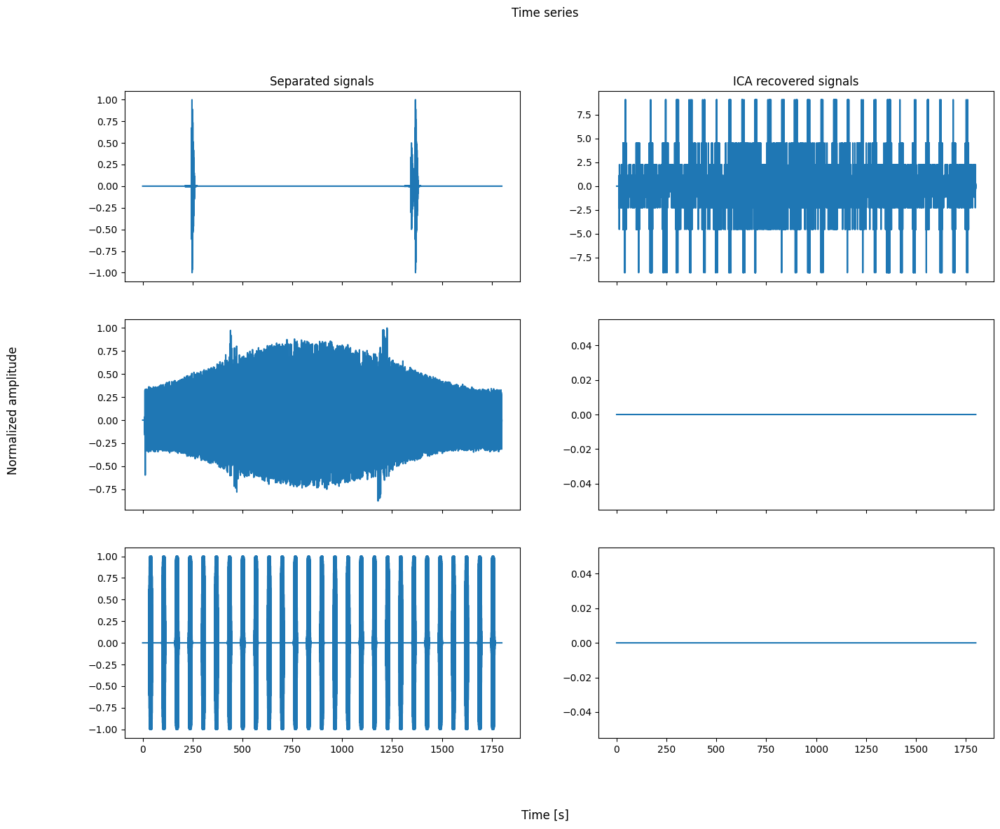

c:\Users\baptiste.menetrier\Desktop\devPy\phd\separation\ica\utils.py:165: RuntimeWarning: divide by zero encountered in log10
  20 * np.log10(abs(reconstructed_signals["stft"][i])),


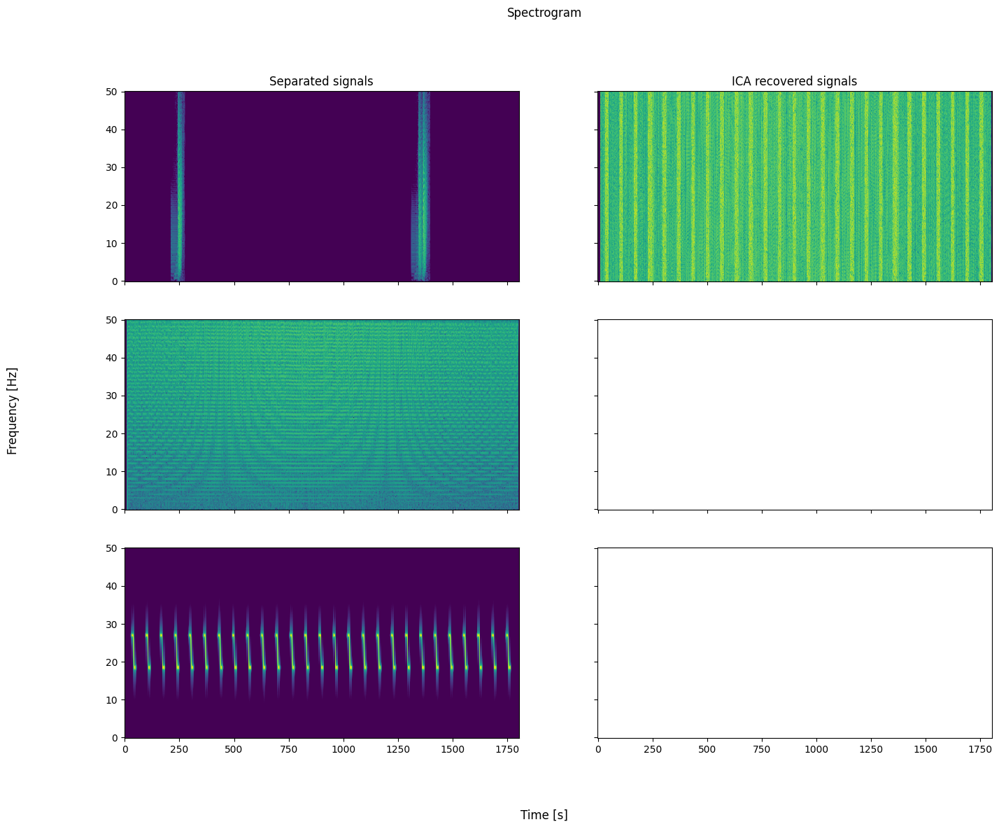

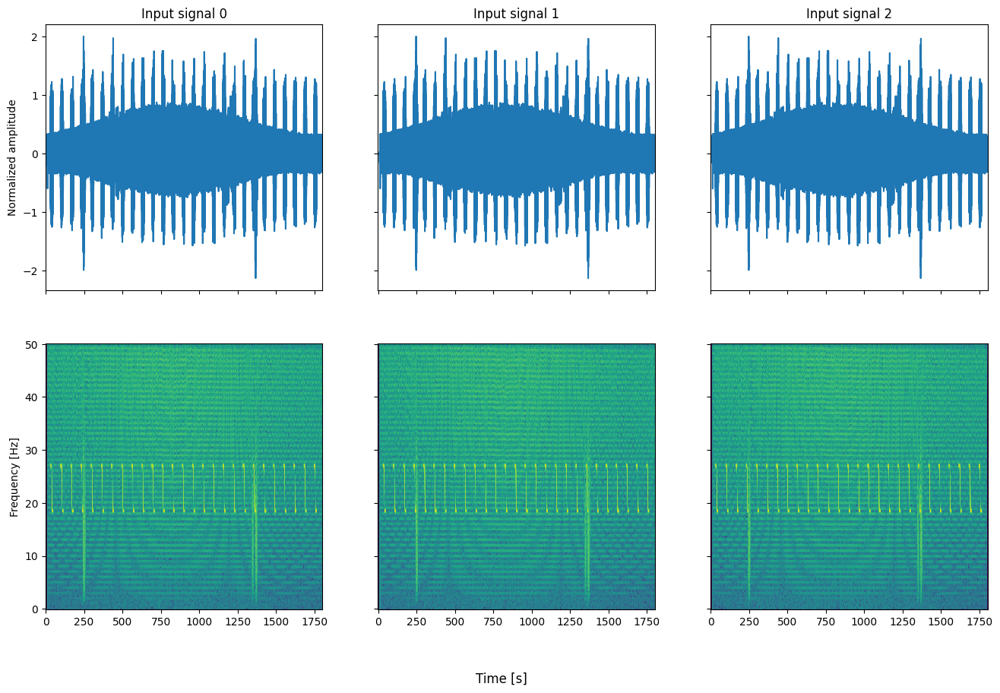

In [9]:
snr = None 
# Mix data
X, S, A = mix_synthetic_signals(
    data,
    mixing_noise_level=mixing_noise_level,
    verbose=True,
    a0=2,
    n_rcv=n_rcv,
    snr=snr,
)
# Apply ICA
S_, A_ = apply_ica(X, n_components=3)

time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)

#### Concernant le 3ème point 
On peut vérifier la capacité de l'ICA à séparé le bruit du signal. Pour se faire on évalue le SNR en entrée et en sortie de l'ICA. 
Le SNR est estimé à partir de la cohérence $\Gamma_{xy}$ entre deux signaux : 

$
SNR = \frac{\Gamma_{xy}}{1 - \Gamma_{xy}}
$

Mixing matrix : [[2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]]
ICA model applies : True
Components : [[ 1.47763998 -2.30914421  0.84249818]
 [ 0.81940808  0.8325326   0.83619066]
 [ 1.82720312  0.37205609 -2.18712156]]
Mixing : [[ 0.18004176  0.40002812  0.22229429]
 [-0.28037348  0.40292227  0.04604485]
 [ 0.10271867  0.40274045 -0.2636762 ]]
Mean : [5.69404907e-04 1.52431056e-04 1.22952065e-05]


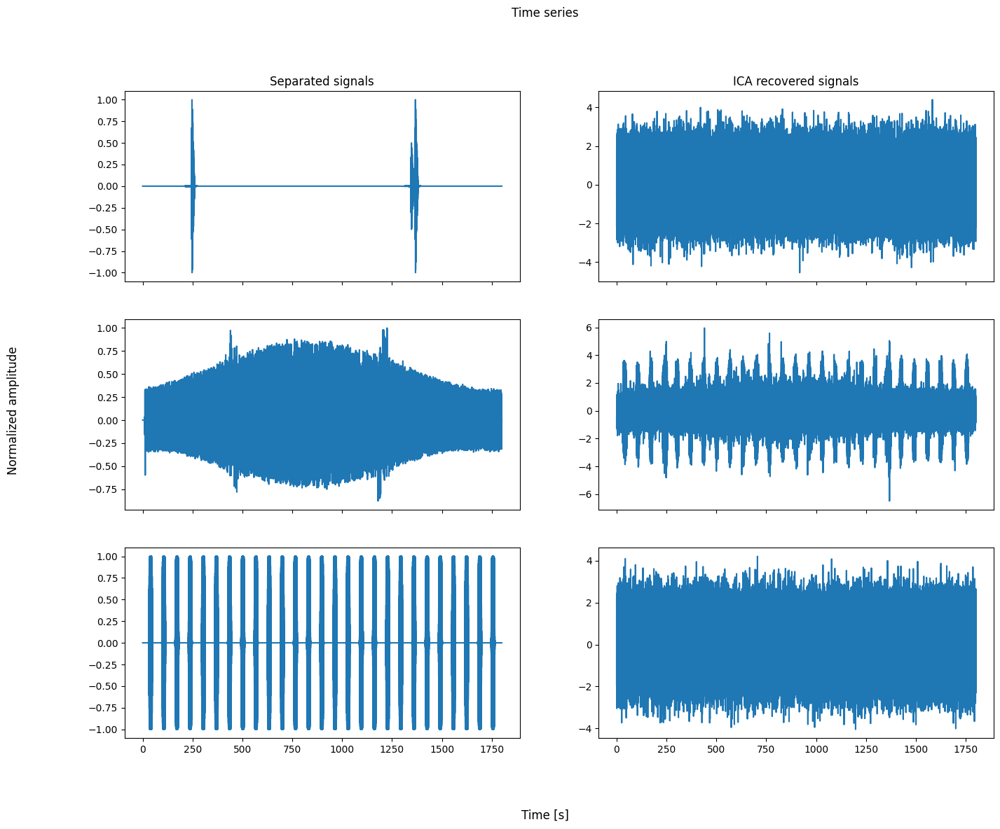

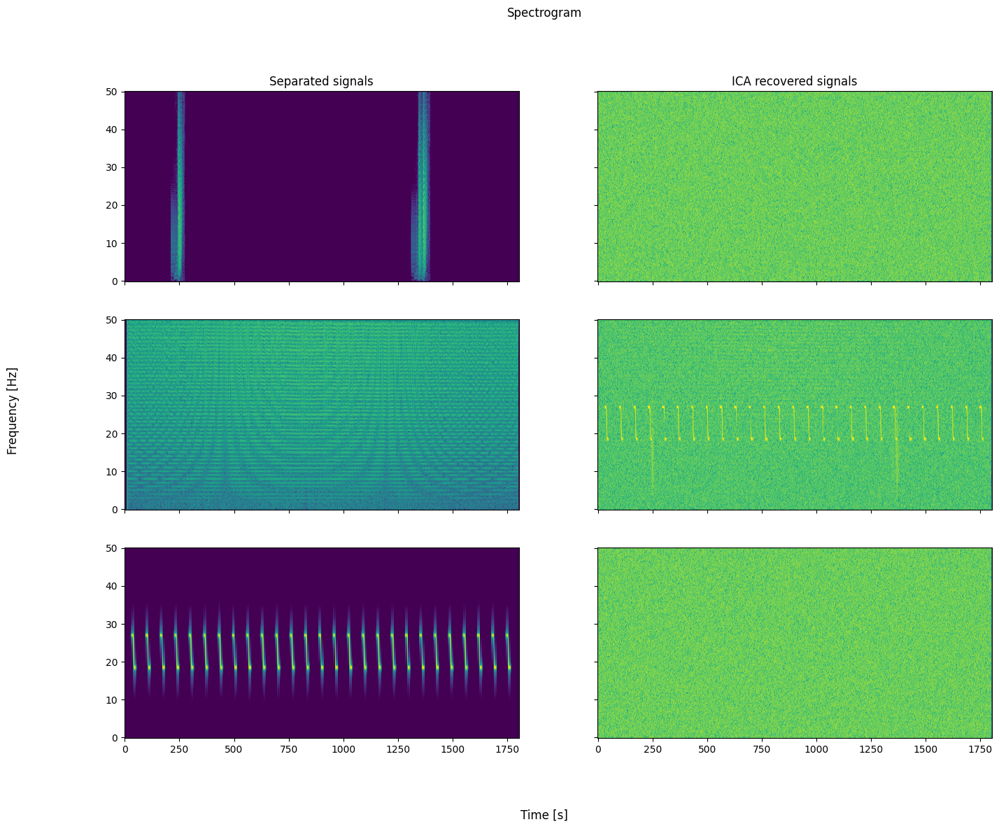

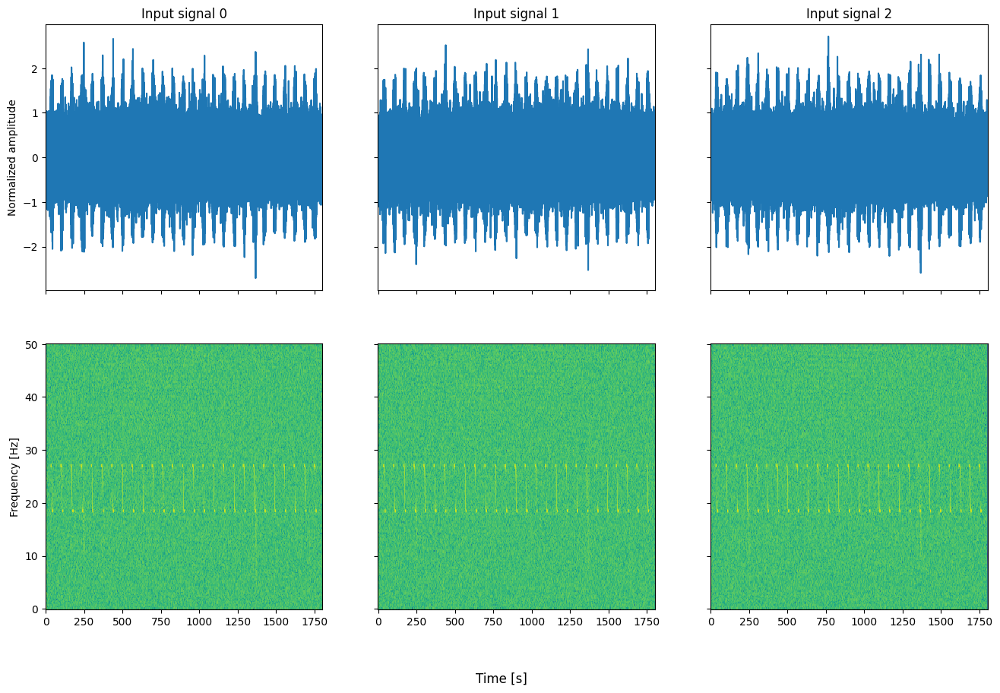

In [10]:
snr = 0
# Mix data
X, S, A = mix_synthetic_signals(
    data,
    mixing_noise_level=mixing_noise_level,
    verbose=True,
    a0=2,
    n_rcv=n_rcv,
    snr=snr,
)
# Apply ICA
S_, A_ = apply_ica(X, n_components=3)

time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)

In [11]:
# Derive coherence between noiseless input signal and output signal
X_noiseless, _, _ = mix_synthetic_signals(
    data,
    mixing_noise_level=mixing_noise_level,
    a0=2,
    n_rcv=n_rcv,
    snr=None,
    verbose=False,
)
input = X_noiseless[:, 1]
output = S_[:, 2]
f, gamma_xy = sp.coherence(
    input, output, fs=fs, nperseg=nperseg, noverlap=noverlap
)
snr_coh_ouput = np.mean(gamma_xy / (1 - gamma_xy))
snr_output = 10 * np.log10(snr_coh_ouput)

print(f"SNR input: {snr} dB")
print(f"SNR output: {snr_output:.2f} dB")

SNR input: 0 dB
SNR output: -27.80 dB


Gain -> $\approx 5$ dB 

## Test avec une matrice de mélange bruitée
Au vu des précédentes constatations on peut étudier le cas d'une matrice de mélange bruité (non symétrique). L'idée est d'introduire de l'indépendance entre les différentes équations du système. 

In [12]:
snr = 1
print(data["vars"])
X, S, A = mix_synthetic_signals(data, mixing_noise_level=0.9, verbose=True, a0=2, n_rcv=n_rcv, snr=snr)
S_, A_ = apply_ica(X, n_components=3)

['ondeT', 'navire', 'Zcall']
Mixing matrix : [[ 4.38957303  0.86185595  0.51988513]
 [ 0.74683307  1.79070191  1.28343481]
 [ 1.7610589  -0.18025071  0.61320274]]
ICA model applies : True
Components : [[-4.00974626  1.51605006  0.20063998]
 [ 0.94784686  0.64898853  1.97267541]
 [ 1.75308152  1.17997662 -3.84498049]]
Mixing : [[-0.1602162   0.20150299  0.09502108]
 [ 0.23594357  0.50046298  0.26907567]
 [-0.00064088  0.24545918 -0.13417943]]
Mean : [-6.18120509e-04  1.95989693e-03 -9.53596666e-05]


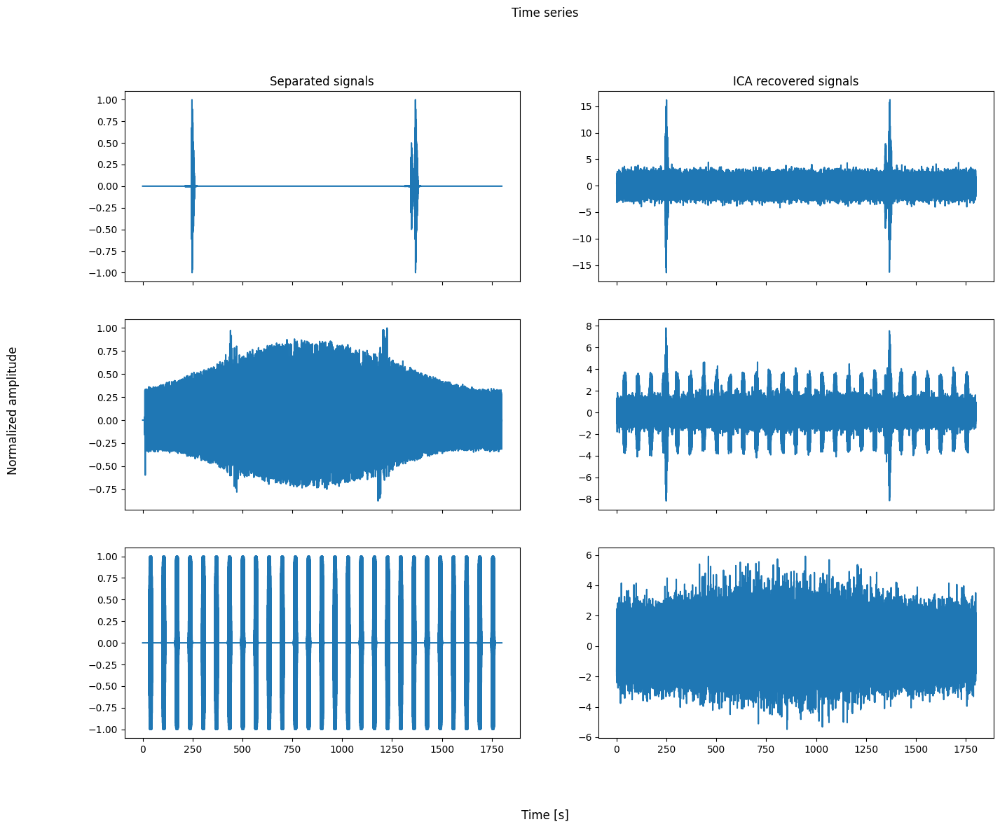

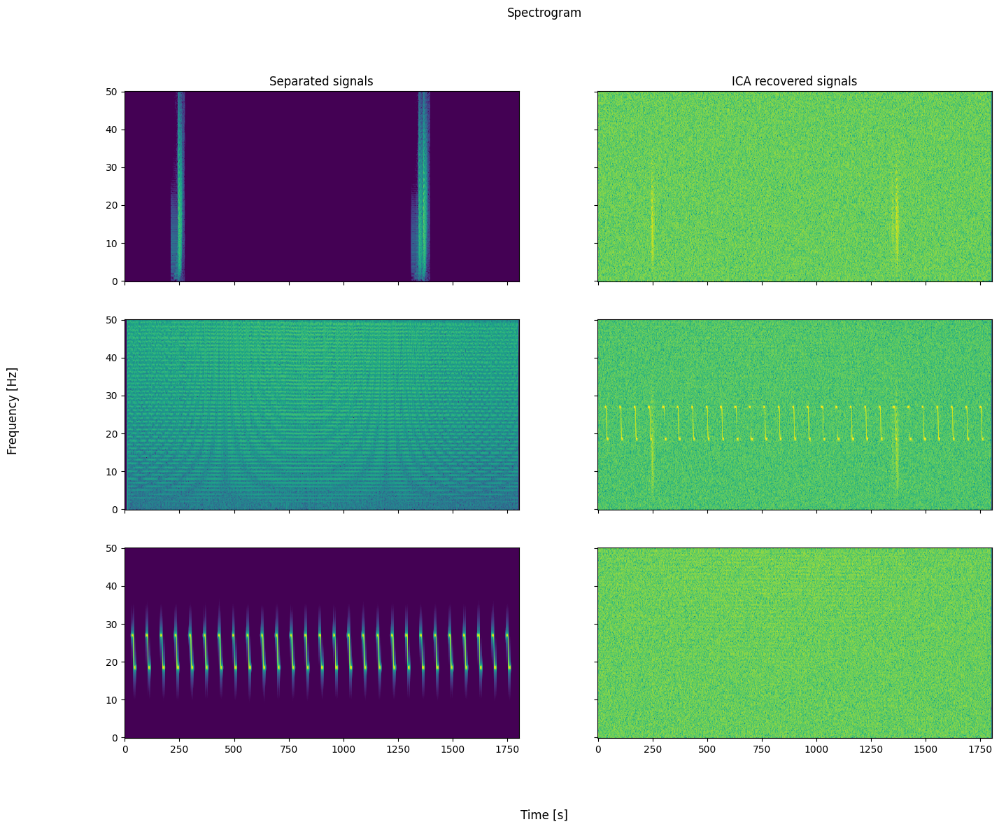

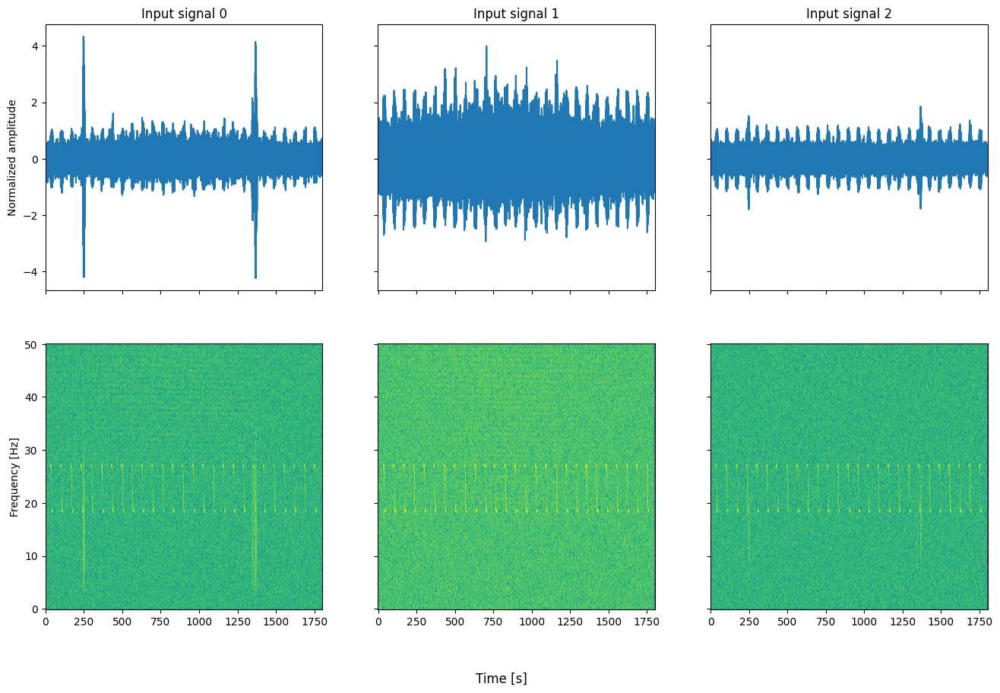

In [14]:
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120)

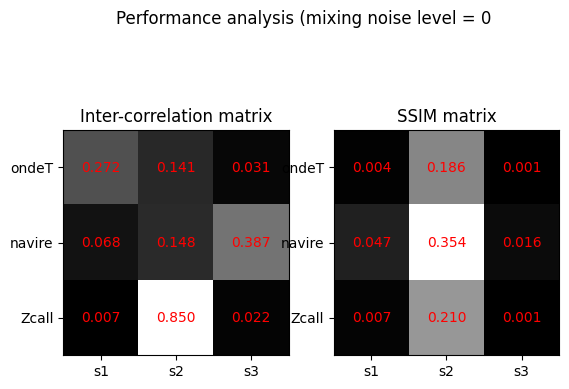

In [15]:
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])

C'est un peut-être un tout petit peu mieux, mais c'est toujours vraiment naze 

On peut essayer de regarder ce que ça donne en fonction du bruit dans la matrice de mélange 

Mixing matrix : [[2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]]


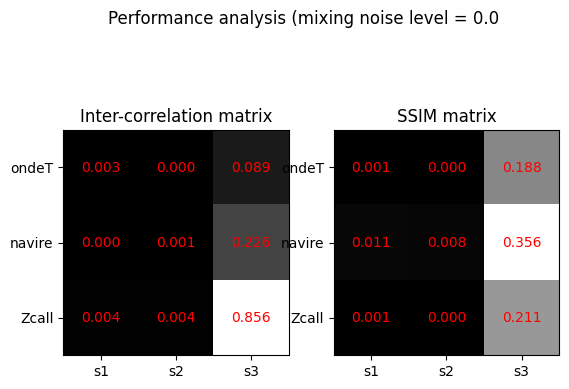

Mixing matrix : [[ 2.85220999  0.73242928  3.32380924]
 [ 3.43571963  0.86145146  1.97982353]
 [ 2.84503442 -1.5145858  -0.6612314 ]]


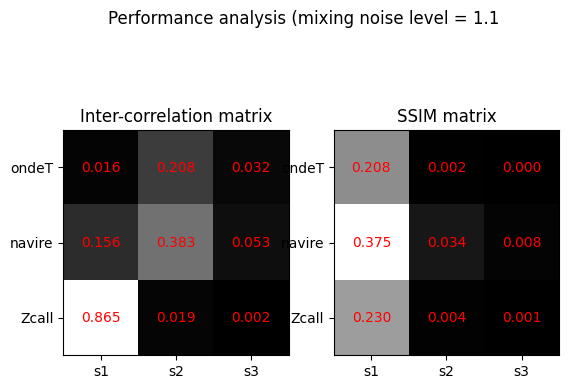

Mixing matrix : [[ 1.266186    3.65998217  2.03049499]
 [ 8.36558719 -1.91021806 -0.53238384]
 [ 0.58892225  0.97919025  0.32214846]]


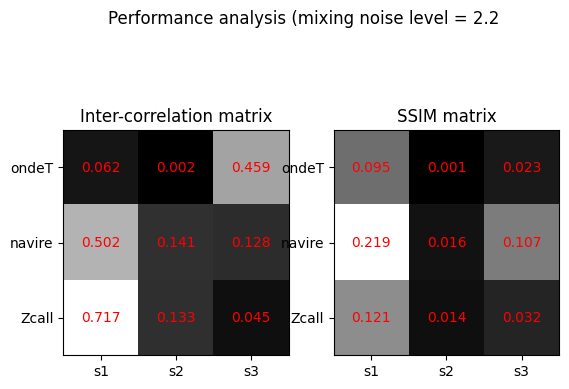

Mixing matrix : [[-2.72064104 -1.23909844 -2.97249123]
 [ 6.54712842 -8.51115966  3.76853578]
 [ 3.71974616  2.57965982  1.53906181]]


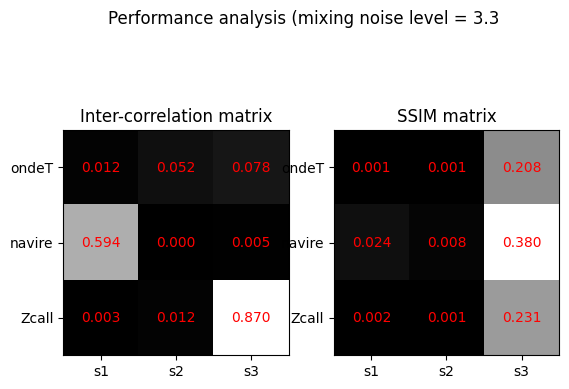

Mixing matrix : [[ 1.66699348 -0.9484165   0.38762769]
 [ 2.08277112 -1.56363034 -9.00047313]
 [ 6.81563684  8.33894515 -5.6430012 ]]


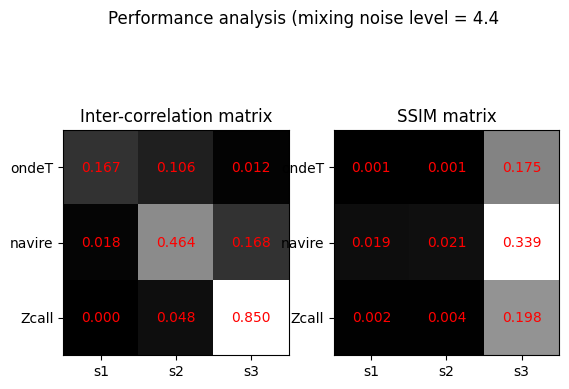

Mixing matrix : [[-4.39588135 -0.76676542 -7.63698013]
 [-4.72326473  5.52332754  5.25475128]
 [-4.89112691  2.54992999  6.74438351]]


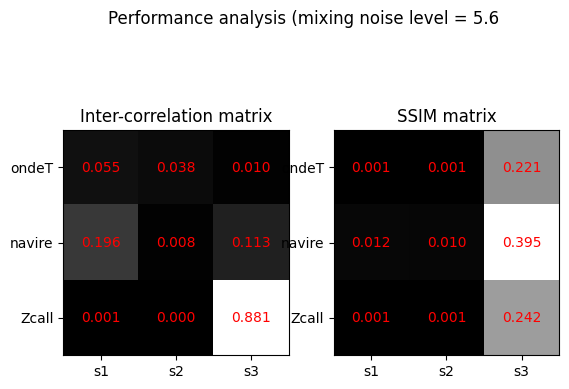

Mixing matrix : [[-3.11317465  0.50424549 10.67980524]
 [ 3.85891747  3.32926118 -0.88844525]
 [-1.92500101  0.02535267  2.41962182]]


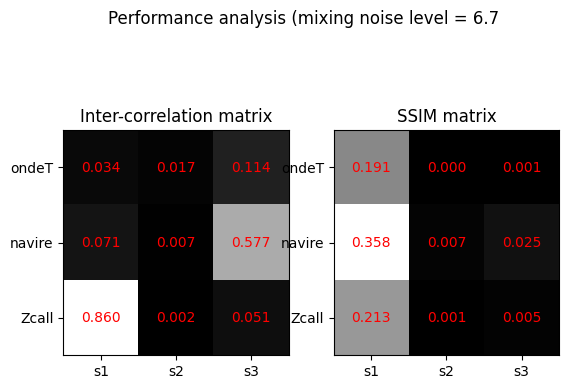

Mixing matrix : [[-11.16362672   9.25393232   1.53770774]
 [  0.74641866  -4.4513216   -6.98839731]
 [ -1.07120236  -3.82874407  -7.59271496]]


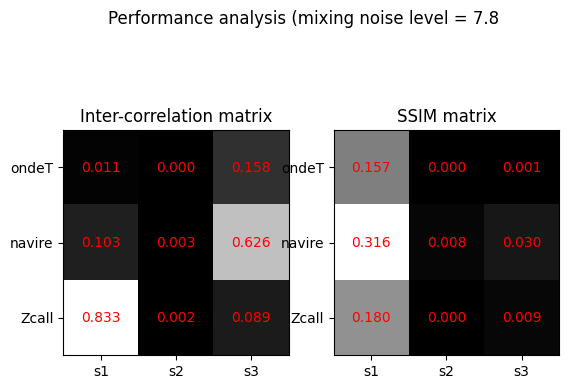

Mixing matrix : [[-7.08514523 11.1980414   2.43857782]
 [ 3.35722118 -2.82049868 16.0482803 ]
 [ 2.90990022 14.04389498 17.57722252]]


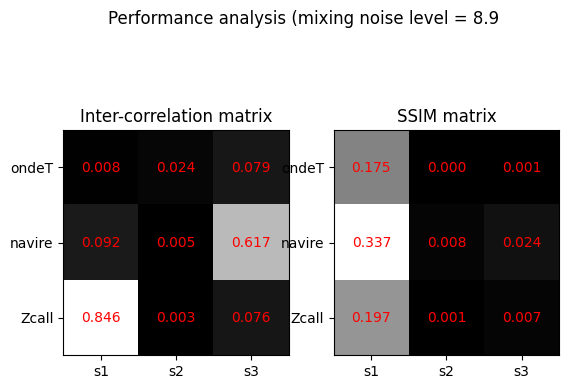

Mixing matrix : [[13.6575727  16.72243106 -1.44650856]
 [ 2.82888916 -3.52812849  7.55725974]
 [ 2.8474435   0.7397048   0.98185796]]


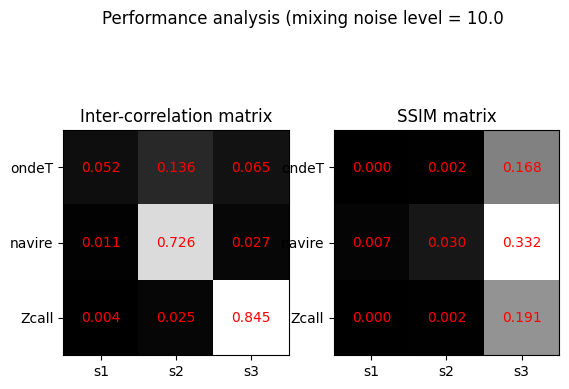

In [16]:
ssim_v = []

snr = 1
for noise_mixing_mat in np.linspace(0, 10, 10):
    X, S, A = mix_synthetic_signals(
        data, mixing_noise_level=noise_mixing_mat, verbose=True, a0=2, n_rcv=n_rcv, snr=snr
    )
    S_, A_ = apply_ica(X, n_components=3, verbose=False)

    time, mixed_signals, reconstructed_signals = analyse_ica(
        X, S_, fs, nperseg, noverlap
    )

    inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data, verbose=False)
    plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"], noise_mixing_mat=noise_mixing_mat)

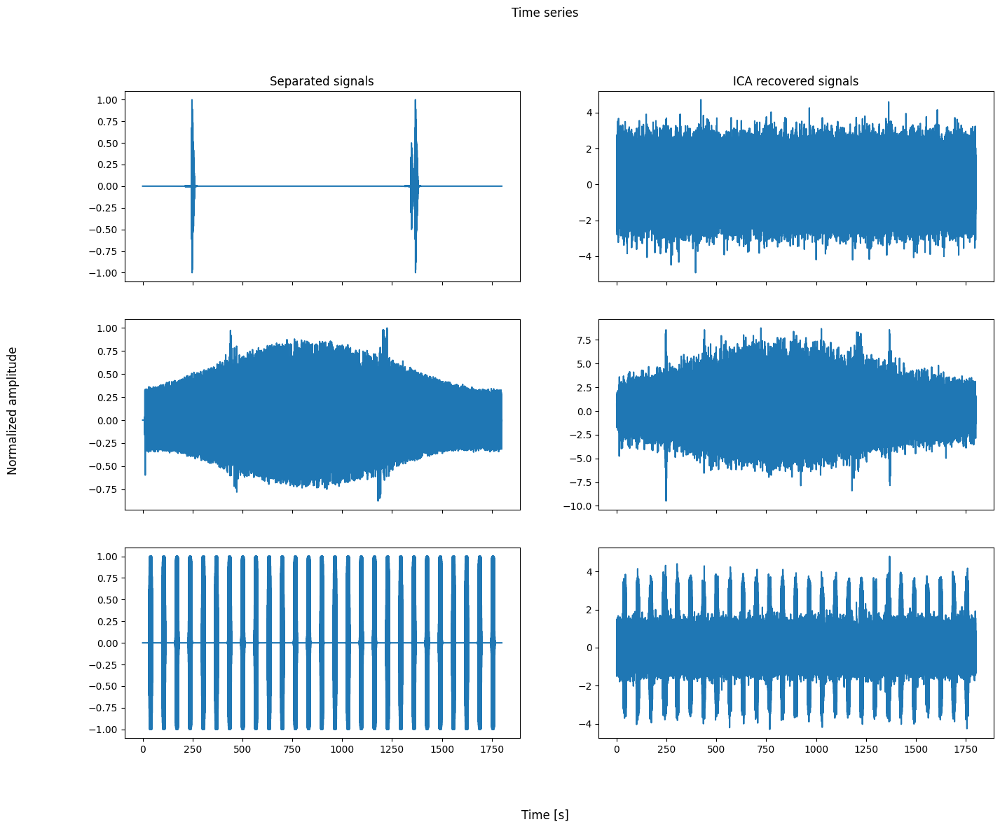

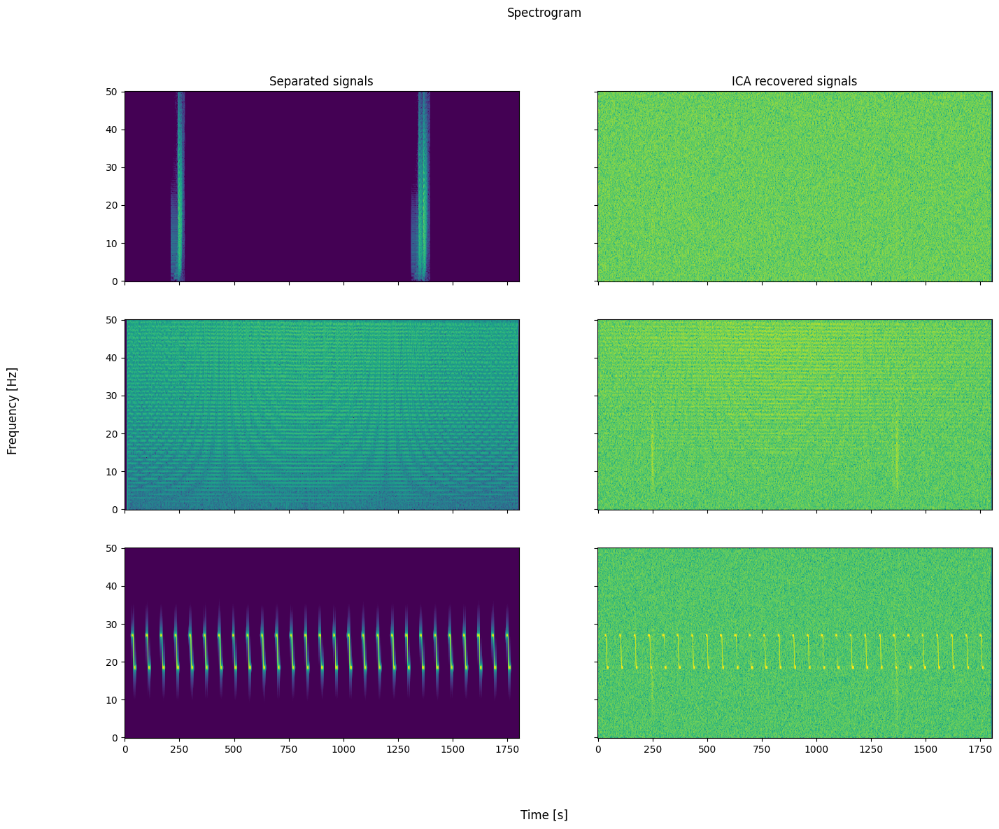

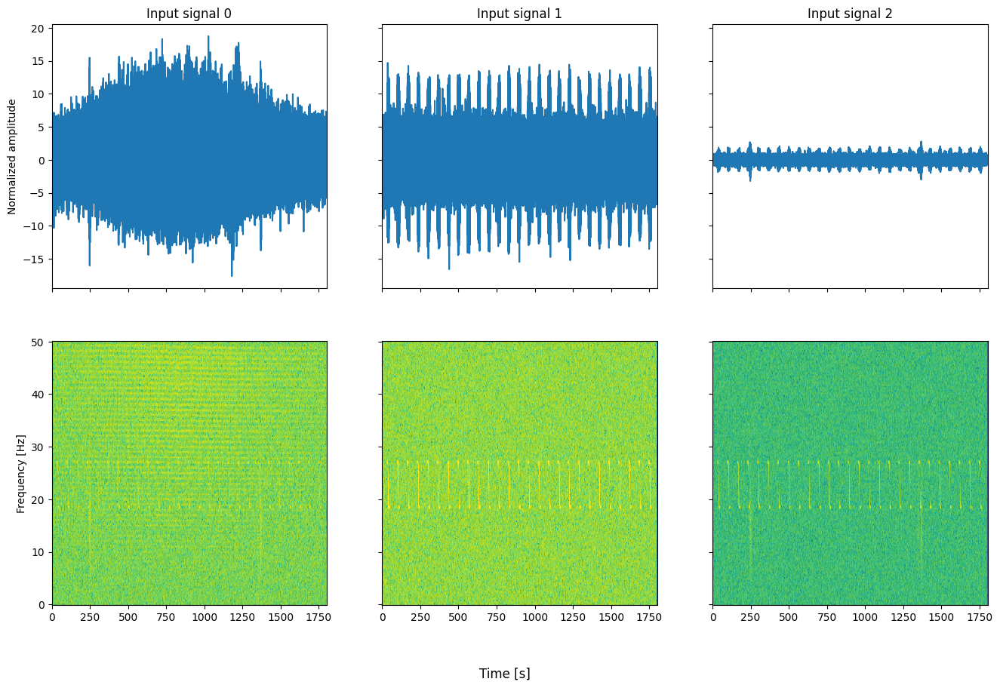

In [17]:
# Plot last results
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)

Remarque : il me semblait qu'avec une matrice de mélange suffisamment complexe ça ne marchait pas trop mal, mais je n'arrive plus à reproduire ... Le bruit sur la matrice étant aléatoire, c'est probable d'avoir un bon résultat si la matrice est proche de l'identité, c'était surement le cas pour les résultats "intéressant" dont j'ai le souvenir

## Real data

In [18]:
data = load_real_data(nperseg=nperseg, noverlap=noverlap)
plot_input_signals(data)

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\baptiste.menetrier\\Desktop\\devPy\\phd\\data\\wav\\RHUMRUM\\signal_BDH_RR44_2013-05-3.wav'

['BDH', 'BHZ', 'BH1', 'BH2']
ICA model applies : False
Components : [[ 0.00040433  0.00063041  0.01046479 -0.00010013]]
Mixing : [[ 3.67296292]
 [ 5.72670613]
 [95.06289391]
 [-0.90960598]]
Mean : [-1.14130425e-05  4.39982714e-02 -1.17789873e-01 -2.79818717e-02]


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

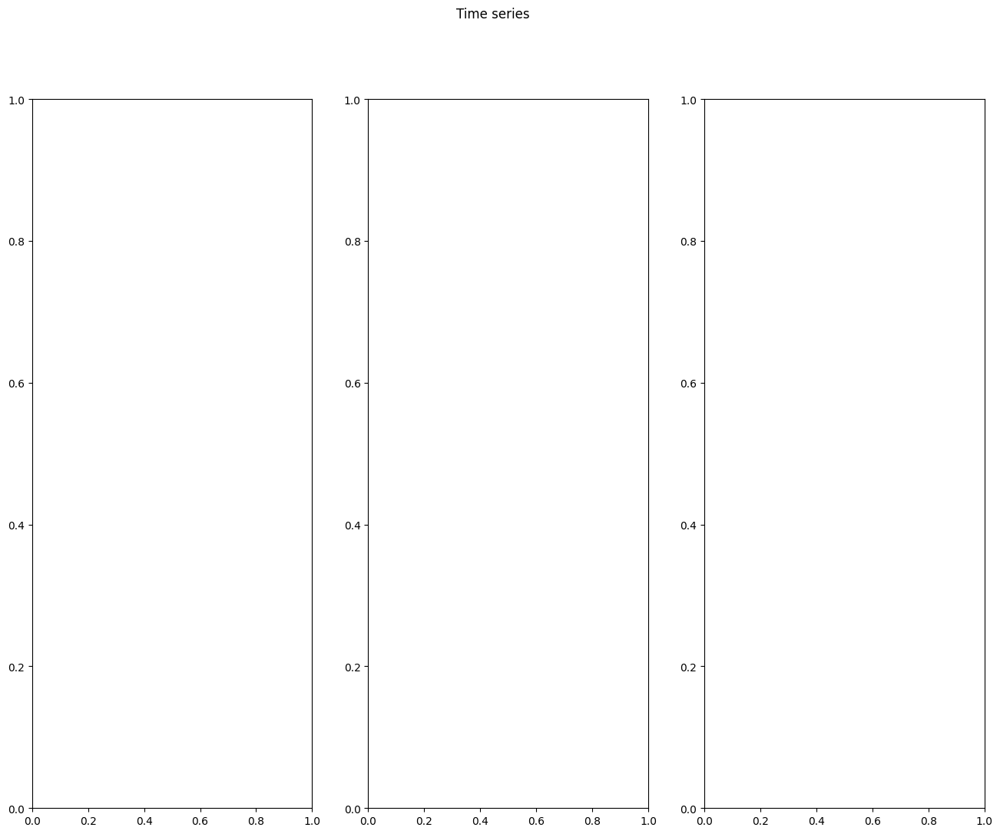

In [ ]:
print(data["vars"])
X = np.c_[tuple([data["signal"][iv] for iv in range(len(data["vars"]))])]

S_, A_ = apply_ica(X, n_components=3)
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])